# YOLOv11 on Blood Cell Dataset

## Introduction

This notebook focuses on training and evaluating the YOLOv11 model for blood cell detection and classification. The dataset consists of images of different blood cell types, each labeled with corresponding bounding boxes. The key objectives of this notebook are:

- **Data Preparation:** Cleaning the dataset by removing incorrectly labeled images.
- **Model Training:** Fine-tuning the YOLOv11 model using a pretrained weight (`yolo11n.pt`).
- **Validation:** Performed on individual images.
- **Prediction:**  Applied to both combined and individual images.

For more details on YOLOv11, refer to the official [Ultralytics documentation](https://docs.ultralytics.com).

In [ ]:
%pip install ultralytics

In [1]:
%matplotlib inline
import os
import cv2
import random
import shutil
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from pathlib import Path

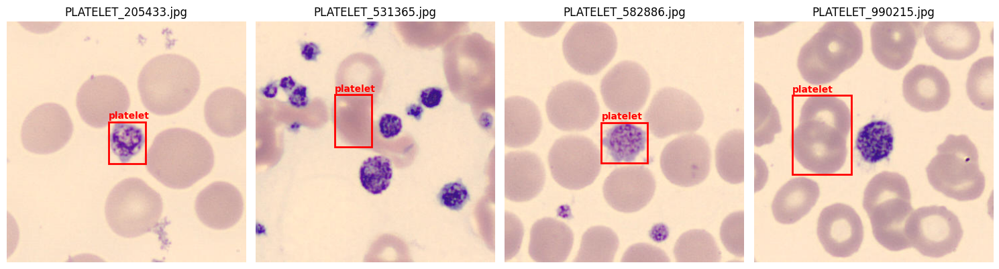

In [ ]:
# Define paths
image_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/images"
label_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/labels"

# Class names (index corresponds to YOLO label)
class_names = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
               'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Get all image files
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Select random images
num_images_to_display = 4
selected_images = random.sample(image_files, min(num_images_to_display, len(image_files)))

# Function to read labels and parse YOLO format
def load_yolo_labels(label_path):
    labels = []
    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            labels.append((class_id, x_center, y_center, width, height))
    return labels

# Plot images with bounding boxes
fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(image_dir, img_name)
    label_path = os.path.join(label_dir, img_name.replace('.jpg', '.txt'))

    # Read image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib

    # Get image dimensions
    h, w, _ = image.shape

    # Read labels
    labels = load_yolo_labels(label_path)

    # Plot image
    ax = axes[i] if len(selected_images) > 1 else axes
    ax.imshow(image)
    ax.set_title(img_name)
    ax.axis("off")

    # Draw bounding boxes
    for class_id, x_center, y_center, width, height in labels:
        # Convert YOLO format to pixel values
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        box_w = int(width * w)
        box_h = int(height * h)

        # Create rectangle
        rect = patches.Rectangle((x_min, y_min), box_w, box_h, linewidth=2, 
                                 edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, class_names[class_id], color='red', fontsize=10, weight='bold')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

## Remove Images Without Labels

In [86]:
# Define paths
platelets_img_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/images"
platelets_lbl_dir = "/Users/afnanag/projects/DH307/yolov11/data/platelet/labels"

# Get all image names (without extension)
image_files = [f for f in os.listdir(platelets_img_dir) if f.endswith('.jpg')]

# Delete images that don't have a matching label
for img_file in image_files:
    label_file = img_file.replace('.jpg', '.txt')
    label_path = os.path.join(platelets_lbl_dir, label_file)

    if not os.path.exists(label_path):
        os.remove(os.path.join(platelets_img_dir, img_file))
        print(f"Deleted: {img_file}")

print("Cleanup complete: Removed images without labels.")


Deleted: PLATELET_70358.jpg
Deleted: PLATELET_127607.jpg
Deleted: PLATELET_8089.jpg
Deleted: PLATELET_208927.jpg
Deleted: PLATELET_451360.jpg
Deleted: PLATELET_296115.jpg
Deleted: PLATELET_559926.jpg
Deleted: PLATELET_568251.jpg
Deleted: PLATELET_342998.jpg
Deleted: PLATELET_287352.jpg
Deleted: PLATELET_111377.jpg
Deleted: PLATELET_459305.jpg
Deleted: PLATELET_194627.jpg
Deleted: PLATELET_450479.jpg
Deleted: PLATELET_71521.jpg
Deleted: PLATELET_562150.jpg
Deleted: PLATELET_634351.jpg
Deleted: PLATELET_415455.jpg
Deleted: PLATELET_481546.jpg
Deleted: PLATELET_68662.jpg
Deleted: PLATELET_430945.jpg
Deleted: PLATELET_175036.jpg
Deleted: PLATELET_830843.jpg
Deleted: PLATELET_930880.jpg
Deleted: PLATELET_390200.jpg
Deleted: PLATELET_147287.jpg
Deleted: PLATELET_145453.jpg
Deleted: PLATELET_327246.jpg
Deleted: PLATELET_358860.jpg
Deleted: PLATELET_620286.jpg
Deleted: PLATELET_138731.jpg
Deleted: PLATELET_534883.jpg
Deleted: PLATELET_988461.jpg
Deleted: PLATELET_720679.jpg
Deleted: PLATELET_5

## Prepare Train and Validation Sets

In [ ]:
# Define paths
base_dir = "/Users/afnanag/projects/DH307/yolov11/data"
all_images_dir = os.path.join(base_dir, "all_images")
all_labels_dir = os.path.join(base_dir, "all_labels")

# Create directories if they don't exist
os.makedirs(all_images_dir, exist_ok=True)
os.makedirs(all_labels_dir, exist_ok=True)

# List of class names
classes = ['basophil', 'eosinophil', 'erythroblast', 'immunoglobin', 
           'lymphocyte', 'monocyte', 'neutrophil', 'platelet', 'lymphoblast']

# Move images and labels into a single folder
for cls in classes:
    img_dir = os.path.join(base_dir, cls, "images")
    lbl_dir = os.path.join(base_dir, cls, "labels")

    if os.path.exists(img_dir):
        for img_name in os.listdir(img_dir):
            shutil.move(os.path.join(img_dir, img_name), os.path.join(all_images_dir, img_name))

    if os.path.exists(lbl_dir):
        for lbl_name in os.listdir(lbl_dir):
            shutil.move(os.path.join(lbl_dir, lbl_name), os.path.join(all_labels_dir, lbl_name))

print("All images and labels combined successfully!")


All images and labels combined successfully!


In [ ]:
# Define train/val directories
train_img_dir = os.path.join(base_dir, "train/images")
train_lbl_dir = os.path.join(base_dir, "train/labels")
val_img_dir = os.path.join(base_dir, "val/images")
val_lbl_dir = os.path.join(base_dir, "val/labels")

# Create train/val directories
for d in [train_img_dir, train_lbl_dir, val_img_dir, val_lbl_dir]:
    os.makedirs(d, exist_ok=True)

# Get all images
all_images = [f for f in os.listdir(all_images_dir) if f.endswith('.jpg')]

# Shuffle and split (80% train, 20% val)
random.shuffle(all_images)
split_idx = int(0.8 * len(all_images))
train_files = all_images[:split_idx]
val_files = all_images[split_idx:]

# Move images and labels to train/val folders
for file_list, img_dest, lbl_dest in [(train_files, train_img_dir, train_lbl_dir), 
                                       (val_files, val_img_dir, val_lbl_dir)]:
    for img_name in file_list:
        shutil.move(os.path.join(all_images_dir, img_name), os.path.join(img_dest, img_name))
        lbl_name = img_name.replace('.jpg', '.txt')
        shutil.move(os.path.join(all_labels_dir, lbl_name), os.path.join(lbl_dest, lbl_name))

print(f"Data split complete! Train: {len(train_files)}, Val: {len(val_files)}")


Data split complete! Train: 14138, Val: 3535


## Train the Model

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")  

model.train(
    data="/Users/afnanag/projects/DH307/yolov11/dataset.yaml",
    epochs=300,
    imgsz=384,
    batch=16,
    device="mps",
    optimizer="AdamW",
    lr0=0.001,
    dropout=0.1,
    patience=50,
    workers=8,
    augment=False
)


## Resume Training

In [ ]:
from ultralytics import YOLO

model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train4/weights/last.pt")  

model.train(
    resume = True,
    data="/Users/afnanag/projects/DH307/yolov11/dataset.yaml",
    epochs=300,
    imgsz=384,
    batch=16,
    device="mps",
    optimizer="AdamW",
    lr0=0.001,
    dropout=0.1,
    patience=50,
    workers=8,
    augment=False
)


## Prediction on Individual Images


image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/PLATELET_432812.jpg: 384x384 2 plateletss, 27.2ms
Speed: 1.0ms preprocess, 27.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/EO_452949.jpg: 384x384 1 eosinophil, 28.7ms
Speed: 0.8ms preprocess, 28.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/LY_792776.jpg: 384x384 1 lymphocyte, 28.3ms
Speed: 0.6ms preprocess, 28.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/LY_258828.jpg: 384x384 1 lymphocyte, 27.3ms
Speed: 0.7ms preprocess, 27.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 384)

image 1/1 /Users/afnanag/projects/DH307/yolov11/data/val/images/LY_442318.jpg: 384x384 1 lymphocyte, 28.8ms
Speed: 0.7ms preprocess, 28.8ms inference, 0.6ms postprocess 

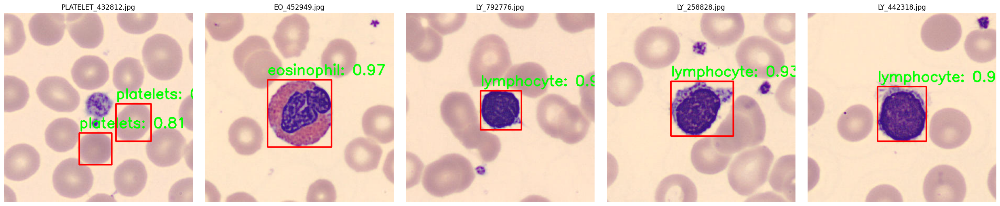

In [6]:
%matplotlib inline
# Load the trained model
model = YOLO("/Users/afnanag/projects/DH307/yolov11/runs/detect/train4/weights/best.pt")

# Path to validation images
val_img_dir = "/Users/afnanag/projects/DH307/yolov11/data/val/images"

# Get all image files in the validation directory
image_files = [f for f in os.listdir(val_img_dir) if f.endswith((".jpg", ".png", ".jpeg"))]

# Randomly select a subset of images (e.g., 5 images)
num_images = min(5, len(image_files))  # Adjust number if fewer images exist
random_imgs = random.sample(image_files, num_images)

# Set up the figure for multiple images
fig, axes = plt.subplots(1, num_images, figsize=(num_images * 5, 5))

if num_images == 1:
    axes = [axes]  # Ensure axes is iterable if only one image is selected

# Process each image
for ax, img_name in zip(axes, random_imgs):
    img_path = os.path.join(val_img_dir, img_name)

    # Predict
    results = model(img_path)
    result = results[0]  # Access first result

    # Load and convert image for display
    image = cv2.imread(img_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Extract bounding boxes
    boxes = result.boxes.xyxy.cpu().numpy()
    confidences = result.boxes.conf.cpu().numpy()
    class_indices = result.boxes.cls.cpu().numpy()

    # Draw bounding boxes
    for box, conf, class_idx in zip(boxes, confidences, class_indices):
        x1, y1, x2, y2 = map(int, box)
        label = f"{result.names[int(class_idx)]}: {conf:.2f}"
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(image_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display the image
    ax.imshow(image_rgb)
    ax.axis("off")
    ax.set_title(img_name)

plt.tight_layout()
plt.show()



## Validation on Individual Images

In [13]:
model.val()

Ultralytics 8.3.70 🚀 Python-3.11.0 torch-2.6.0 CPU (Apple M1 Pro)


val: Scanning /Users/afnanag/projects/DH307/yolov11/data/val/labels.cache... 3535 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3535/3535 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 3535. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 221/221 [05:02<00:00,  1.37s/it]


                   all       3535       3535      0.954      0.955      0.976      0.927
              basophil        259        259      0.981      0.988      0.992      0.963
            eosinophil        630        630      0.973      0.987      0.993      0.965
           erythoblast        320        320      0.972      0.968      0.988      0.924
          immunoglobin        574        574      0.949       0.96      0.975      0.905
            lymphocyte        234        234      0.996       0.99      0.995      0.987
              monocyte        281        281      0.961      0.989      0.988        0.9
            neutrophil        664        664      0.959      0.978      0.989      0.935
             platelets        397        397      0.803      0.738      0.867      0.818
           lymphoblast        176        176      0.996          1      0.995      0.947
Speed: 0.2ms preprocess, 83.4ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detec

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x3c3c43b90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

Note: After running the code, relevant plots (including confusion matrix and precision-recall curves) are automatically saved in the default directory. These visualizations have been included in the presentation.

## Prediction on Combined Images


0: 384x384 4 eosinophils, 1 erythoblast, 1 immunoglobin, 3 neutrophils, 1 platelets, 35.1ms
Speed: 4.4ms preprocess, 35.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)


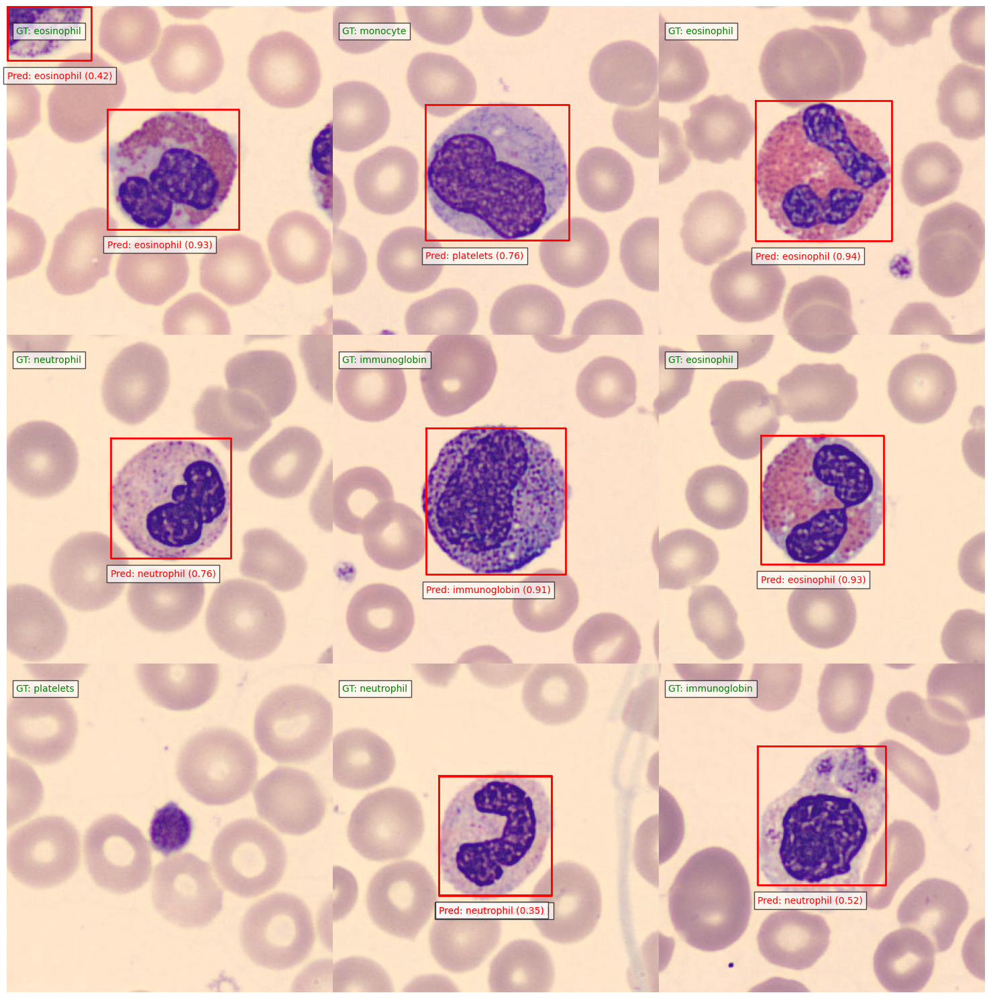

In [23]:
def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    Args:
        label_path: Path to label file
    Returns:
        list of class indices
    """
    classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                # YOLO format: class x_center y_center width height
                class_idx = int(line.split()[0])
                classes.append(class_idx)
    return classes

def create_combined_image_with_labels(img_dir, label_dir, class_names, grid_size=(3, 3)):
    """
    Create a combined image from random validation images with their ground truth labels.
    Args:
        img_dir: Path to images directory
        label_dir: Path to labels directory
        class_names: Dictionary or list of class names
        grid_size: Tuple of (rows, cols) for the grid
    Returns:
        combined_img: Combined image array
        all_labels: List of labels for each image
        selected_images: List of selected image paths
    """
    # Get list of all validation images
    val_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    
    # Randomly select images
    selected_images = random.sample(val_images, grid_size[0] * grid_size[1])
    
    # Read first image to get dimensions
    first_img = cv2.imread(str(selected_images[0]))
    img_height, img_width = first_img.shape[:2]
    
    # Create combined image canvas
    combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), dtype=np.uint8)
    all_labels = []
    
    # Combine images and collect labels
    for idx, img_path in enumerate(selected_images):
        # Get corresponding label file path
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        
        # Read image and labels
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (img_width, img_height))
        class_indices = read_label_file(label_path)
        
        # Convert class indices to names
        labels = [class_names[idx] for idx in class_indices]
        all_labels.append(labels)
        
        # Place image in grid
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        y_start = row * img_height
        y_end = (row + 1) * img_height
        x_start = col * img_width
        x_end = (col + 1) * img_width
        combined_img[y_start:y_end, x_start:x_end] = img
        
    return combined_img, all_labels, selected_images

def visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3)):
    """
    Visualize both predictions and ground truth labels.
    Args:
        combined_img: Combined image array
        all_labels: List of ground truth labels for each image
        results: YOLO prediction results
        grid_size: Tuple of (rows, cols) for the grid
    """
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    img_height = combined_img.shape[0] // grid_size[0]
    img_width = combined_img.shape[1] // grid_size[1]
    
    # Add ground truth labels for each image (top left)
    for idx, labels in enumerate(all_labels):
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        
        # Calculate position for ground truth text
        x = col * img_width + 10
        y = row * img_height + 30
        
        # Create ground truth label text
        gt_text = "GT: " + ', '.join(set(labels))  # Remove duplicates
        
        # Add white background behind text for better visibility
        plt.text(x, y, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            # Get box coordinates and details
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            
            # Draw box
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            
            # Add prediction label
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Usage example:
label_dir = val_img_dir.replace('images', 'labels')

# Create a combined image with ground truth labels
combined_img, all_labels, selected_images = create_combined_image_with_labels(
    val_img_dir, 
    label_dir,
    model.names,  # Assuming model.names contains the class names
    grid_size=(3, 3)
)

# Run prediction on the combined image
results = model(combined_img)

# Visualize both predictions and ground truth
visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3))

In [8]:
# Prediction on saved image
cv2.imwrite('saved.png', combined_img)

results = model('saved.png')
# Since results is a list, access the first result (index 0)
result = results[0]

# Visualizing the results (this will display the image with bounding boxes and class labels)
result.show()


image 1/1 /Users/afnanag/projects/DH307/yolov11/saved.png: 384x384 2 erythoblasts, 1 immunoglobin, 2 neutrophils, 3 plateletss, 1 lymphoblast, 28.1ms
Speed: 0.9ms preprocess, 28.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)



0: 384x384 2 eosinophils, 1 monocyte, 3 neutrophils, 2 lymphoblasts, 30.0ms
Speed: 2.2ms preprocess, 30.0ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 384)


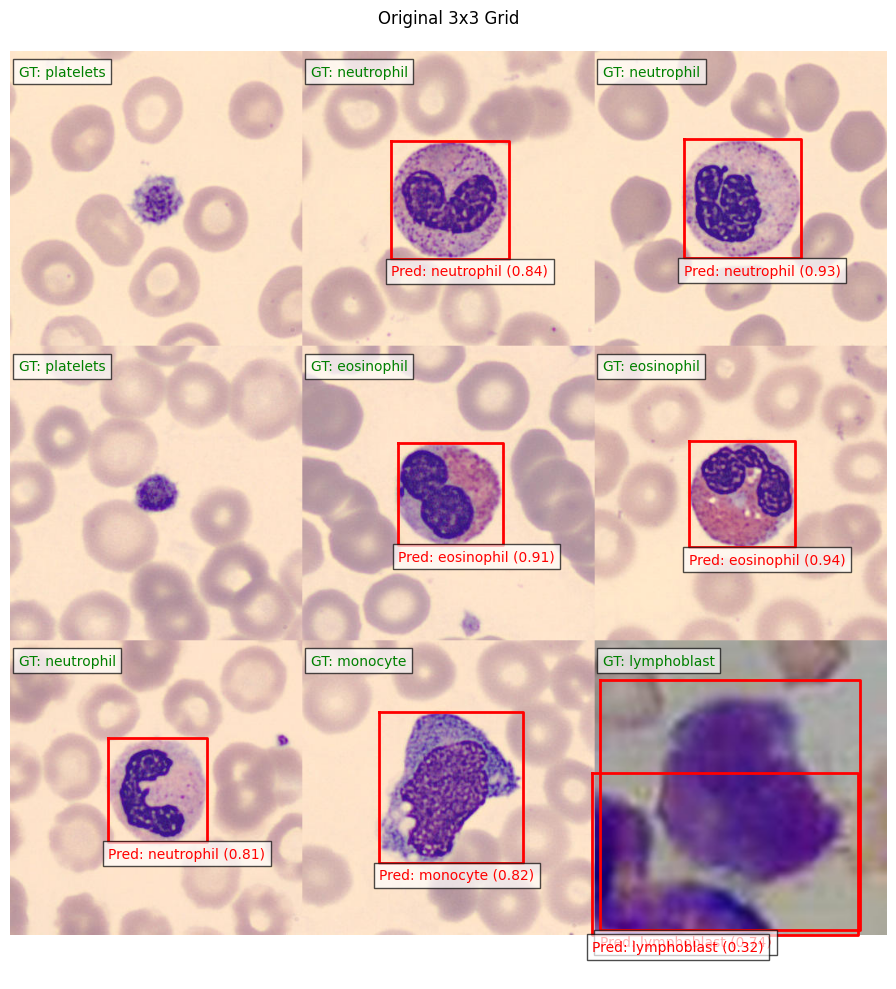


0: 384x384 2 eosinophils, 1 monocyte, 3 neutrophils, 2 lymphoblasts, 37.7ms
Speed: 0.9ms preprocess, 37.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 384)


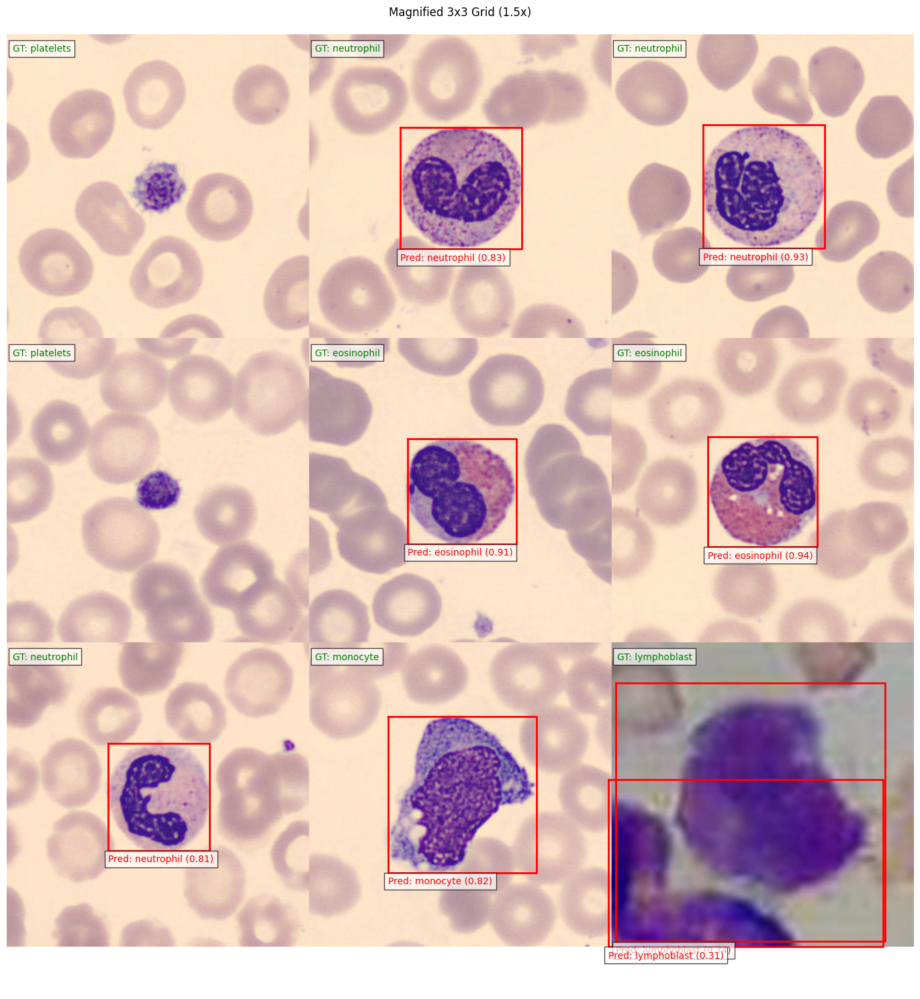


0: 224x384 1 eosinophil, 1 platelets, 15.9ms
Speed: 0.7ms preprocess, 15.9ms inference, 0.3ms postprocess per image at shape (1, 3, 224, 384)


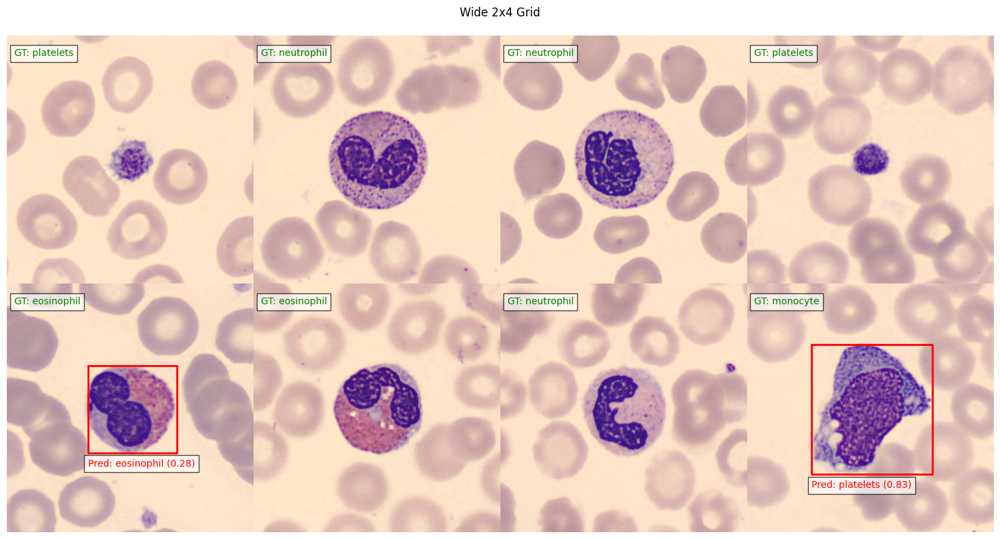


0: 288x384 2 eosinophils, 1 erythoblast, 1 lymphocyte, 1 monocyte, 2 neutrophils, 1 lymphoblast, 23.4ms
Speed: 0.8ms preprocess, 23.4ms inference, 0.3ms postprocess per image at shape (1, 3, 288, 384)


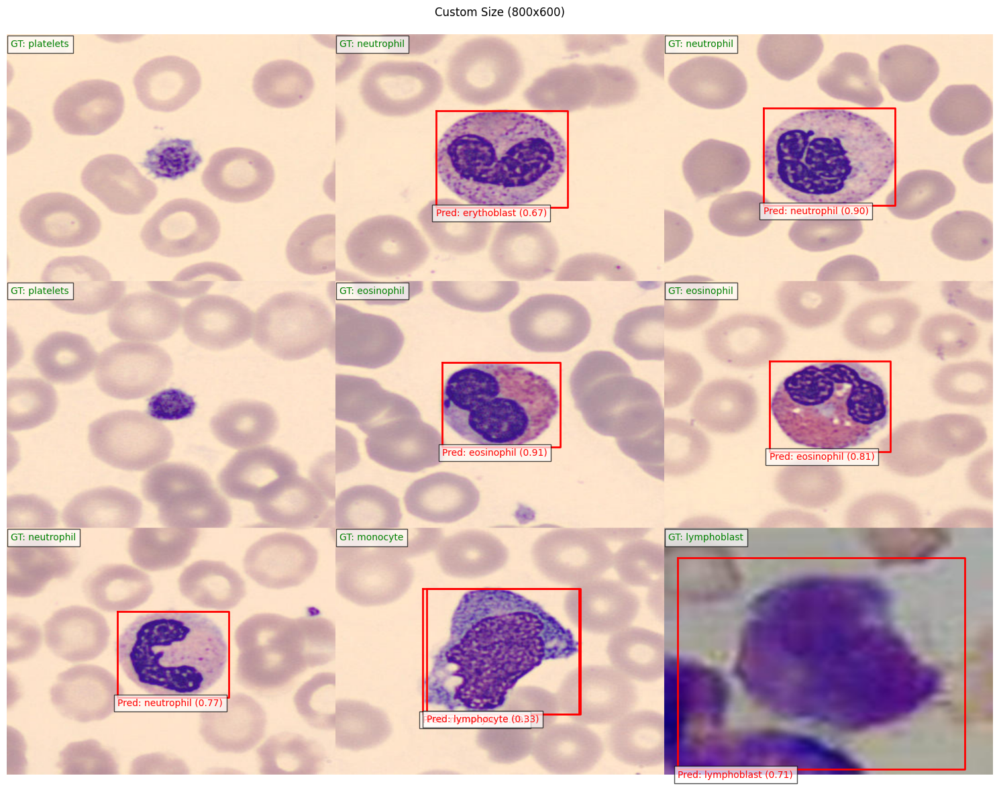

In [ ]:
def select_random_images(img_dir, num_images):
    """
    Select random images from directory
    """
    val_images = list(Path(img_dir).glob("*.jpg")) + list(Path(img_dir).glob("*.png"))
    return random.sample(val_images, num_images)

def read_label_file(label_path):
    """
    Read YOLO format label file and return class indices
    """
    classes = []
    if label_path.exists():
        with open(label_path, 'r') as f:
            for line in f:
                class_idx = int(line.split()[0])
                classes.append(class_idx)
    return classes

def create_combined_image_with_labels(selected_images, label_dir, class_names, grid_size=(3, 3), 
                                    magnification=1.0, target_size=None):
    """
    Create combined image using pre-selected images
    """
    # Read first image to get base dimensions
    first_img = cv2.imread(str(selected_images[0]))
    orig_height, orig_width = first_img.shape[:2]
    
    # Calculate dimensions based on magnification or target size
    if target_size:
        img_width, img_height = target_size
    else:
        img_width = int(orig_width * magnification)
        img_height = int(orig_height * magnification)
    
    # Create combined image canvas
    combined_img = np.zeros((img_height * grid_size[0], img_width * grid_size[1], 3), 
                          dtype=np.uint8)
    all_labels = []
    
    for idx, img_path in enumerate(selected_images):
        label_path = Path(label_dir) / (img_path.stem + '.txt')
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (img_width, img_height))
        class_indices = read_label_file(label_path)
        labels = [class_names[idx] for idx in class_indices]
        all_labels.append(labels)
        
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        y_start = row * img_height
        y_end = (row + 1) * img_height
        x_start = col * img_width
        x_end = (col + 1) * img_width
        combined_img[y_start:y_end, x_start:x_end] = img
        
    return combined_img, all_labels

def visualize_predictions_and_truth(combined_img, all_labels, results, grid_size=(3, 3), 
                                  figure_size=(10, 10), title=None):
    """
    Visualize predictions with optional title
    """
    plt.figure(figsize=figure_size)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    
    if title:
        plt.title(title, pad=20)
    
    img_height = combined_img.shape[0] // grid_size[0]
    img_width = combined_img.shape[1] // grid_size[1]
    
    # Add ground truth labels
    for idx, labels in enumerate(all_labels):
        row = idx // grid_size[1]
        col = idx % grid_size[1]
        x = col * img_width + 10
        y = row * img_height + 30
        gt_text = "GT: " + ', '.join(set(labels))
        plt.text(x, y, gt_text,
                bbox=dict(facecolor='white', alpha=0.7),
                fontsize=10,
                color='green')
    
    # Add predictions and boxes
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
            conf = box.conf.cpu().numpy()[0]
            cls = box.cls.cpu().numpy()[0]
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
            pred_text = f'Pred: {model.names[int(cls)]} ({conf:.2f})'
            plt.text(x1, y2 + 20, pred_text,
                    bbox=dict(facecolor='white', alpha=0.7),
                    fontsize=10,
                    color='red')
    
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage with same images:
def run_multiple_visualizations(val_img_dir, label_dir, model, num_images=9):
    # First, select the images we'll use for all visualizations
    selected_images = select_random_images(val_img_dir, num_images)
    
    # 1. Basic 3x3 grid
    combined_img, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3)
    )
    results = model(combined_img)
    visualize_predictions_and_truth(combined_img, all_labels, results, 
                                  grid_size=(3, 3),
                                  title="Original 3x3 Grid")

    # 2. Same images with magnification
    combined_img_mag, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        magnification=1.5
    )
    results_mag = model(combined_img_mag)
    visualize_predictions_and_truth(combined_img_mag, all_labels, results_mag, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Magnified 3x3 Grid (1.5x)")

    # 3. Same images in 2x4 grid (using first 8 images)
    combined_img_wide, all_labels_wide = create_combined_image_with_labels(
        selected_images[:8], 
        label_dir,
        model.names,
        grid_size=(2, 4)
    )
    results_wide = model(combined_img_wide)
    cv2.imwrite('output_wide.png', combined_img_wide)
    visualize_predictions_and_truth(combined_img_wide, all_labels_wide, results_wide, 
                                  grid_size=(2, 4),
                                  figure_size=(16, 8),
                                  title="Wide 2x4 Grid")

    # 4. Same images with custom size
    combined_img_custom, all_labels = create_combined_image_with_labels(
        selected_images, 
        label_dir,
        model.names,
        grid_size=(3, 3),
        target_size=(800, 600)
    )
    results_custom = model(combined_img_custom)
    visualize_predictions_and_truth(combined_img_custom, all_labels, results_custom, 
                                  grid_size=(3, 3),
                                  figure_size=(15, 15),
                                  title="Custom Size (800x600)")

# Run all visualizations
label_dir = val_img_dir.replace('images', 'labels')
run_multiple_visualizations(val_img_dir, label_dir, model)

# To save any particular visualization:
# cv2.imwrite('output_magnified.png', combined_img_mag)
# cv2.imwrite('output_wide.png', combined_img_wide)
# cv2.imwrite('output_custom.png', combined_img_custom)


image 1/1 /Users/afnanag/projects/DH307/yolov11/resized_output.png: 384x384 3 eosinophils, 1 monocyte, 4 neutrophils, 1 platelets, 28.9ms
Speed: 0.9ms preprocess, 28.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 384)


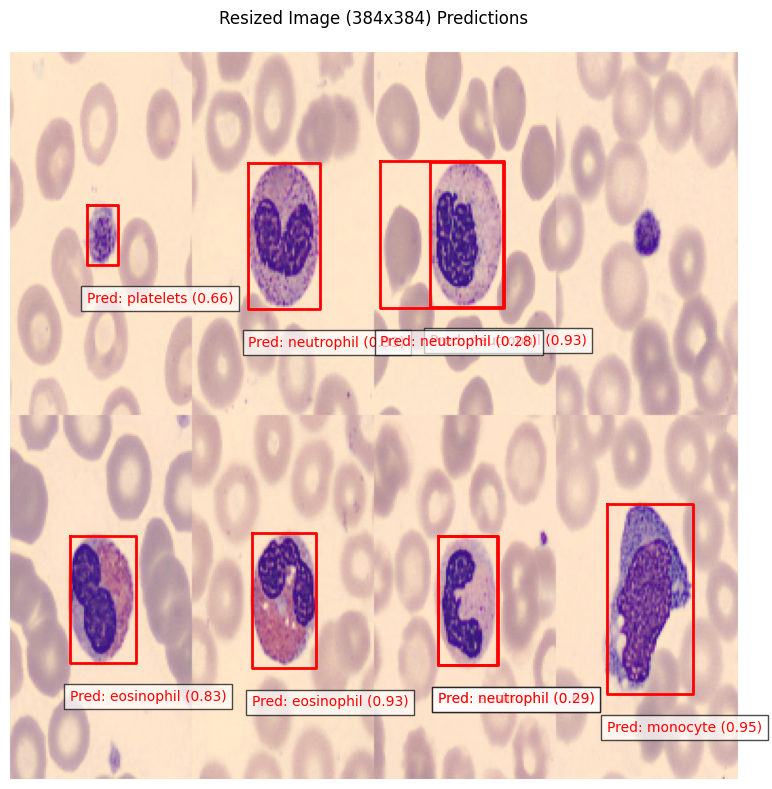

In [ ]:
# Predicting the 2x4 grid image after resizing
# Load the image
image = cv2.imread('output_wide.png')

# Resize to 384x384
resized_image = cv2.resize(image, (384, 384))

# Save the resized image (optional, if needed for debugging)
cv2.imwrite('resized_output.png', resized_image)

# Perform inference
results = model('resized_output.png')

# Perform visualization for the resized image
visualize_predictions_and_truth(resized_image, [], results, 
                              grid_size=(1, 1),  # Single image, so 1x1 grid
                              figure_size=(8, 8),  
                              title="Resized Image (384x384) Predictions")
